<a href="https://colab.research.google.com/github/drSever/drSever_data_science/blob/main/Learning_projects_dl/project_5/Segmentation_practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Практика сегментация

# Задача
Дополнить и исправить код таким образом, чтобы после обучения минимальное качество на валидационной выборке составило IoU = 0.7.

Ограничений нет — можно менять функцию потерь, переписывать код, загрузку данных, модели, можно брать преобученную (не на тех же данных) модель.

# Решение
- возьмем за основу представленый ноутбук
- будем править имеющийся код и дописывать свой для выполнения задания
- будем использовать предобученную модель FCN_ResNet50
- добавим визуализацию аугментированных изображений (тренировочная выборка) и результатов работы модели

## Dataset

Мы будем использовать Oxford-IIIT Pet Dataset. Он состоит из 37 классов собак и кошек, на каждый класс около 200 картинок. В датасете есть как боксы и маски. В датасете около 7 тысяч изображений.  

![alt text](http://www.robots.ox.ac.uk/~vgg/data/pets/pet_annotations.jpg)

Скачаем данные и распакуем

In [1]:
%%capture out
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz
!tar -xvzf images.tar.gz && tar -xvzf annotations.tar.gz
!rm  images/*.mat

Заметим, у нас две папки в данных. Первая с `images` и вторая с разметкой масками как `binary` картинки.

## Импортируем нужные библиотеки

In [2]:
%%capture out
!pip install albumentations torchmetrics pytorch_lightning -U

In [3]:
import os
import random
import copy

import albumentations as A
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pytorch_lightning as pl
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchmetrics
import torchvision
from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights
from albumentations.pytorch.transforms import ToTensorV2
from pytorch_lightning.callbacks import (
    EarlyStopping,
    LearningRateMonitor,
    ModelCheckpoint,
)
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
from tqdm.auto import tqdm

In [4]:
os.listdir()

['.config',
 'images',
 'images.tar.gz',
 'annotations.tar.gz',
 'annotations',
 'sample_data']

## Готовим данные

Каждый пиксель изображения маски может принимать одно из трех значений: «1», «2» или «3». «1» означает, что данный пиксель изображения принадлежит классу «животное», «2» - классу «фон», «3» - классу «граница». Поскольку в этом примере демонстрируется задача двоичной сегментации (то есть присвоение одного из двух классов каждому пикселю), мы предварительно обработаем маску, поэтому она будет содержать только два уникальных значения: 0 если пиксель является фоном, и 1 если пиксель - это животное или граница.

In [5]:
def preprocess_mask(mask):
    mask = mask.astype(np.float32)
    mask[mask == 2.0] = 0.0
    mask[(mask == 1.0) | (mask == 3.0)] = 1.0
    return mask

In [6]:
class PetDataset(Dataset):
    def __init__(self, split="train", transform=None):
        images_train, images_test = train_test_split(
            os.listdir("images"), random_state=142, shuffle=True, train_size=0.8
        )
        if split == "train":
            self.images_filenames = images_train
        else:
            self.images_filenames = images_test

        self.transform = transform

    def __len__(self):
        return len(self.images_filenames)

    def __getitem__(self, idx):
        image_filename = self.images_filenames[idx]
        image = cv2.imread(os.path.join("images", image_filename))
        if image is None:
            return self.__getitem__(idx + 1 if self.__len__() <= idx + 1 else 0)

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(
            os.path.join(
                "annotations", "trimaps", image_filename.replace(".jpg", ".png")
            ),
            cv2.IMREAD_UNCHANGED,
        )
        if mask is None:
            return self.__getitem__(idx + 1 if self.__len__() <= idx + 1 else 0)

        mask = preprocess_mask(mask)

        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]
        return image, mask

In [7]:
train_dataset = PetDataset()
val_dataset = PetDataset(split="val")

### Визуализация для проверки себя, аугментаций, данных

In [8]:
def display_few_examples_from_data(dataset, n=4):
    figure, ax = plt.subplots(nrows=n, ncols=2, figsize=(10, 24))
    for i in range(n):
        image, mask = dataset.__getitem__(i)
        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest")

        ax[i, 0].set_title("Image")
        ax[i, 1].set_title("Mask")

        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
    plt.tight_layout()
    plt.show()

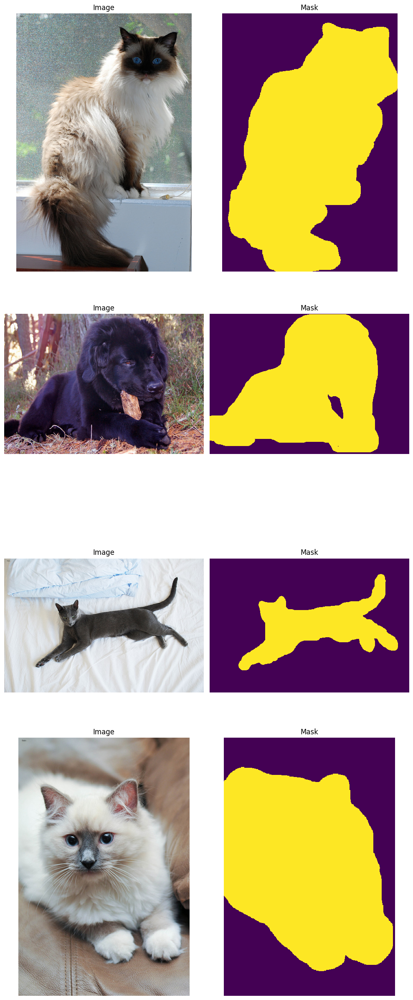

Validation dataset


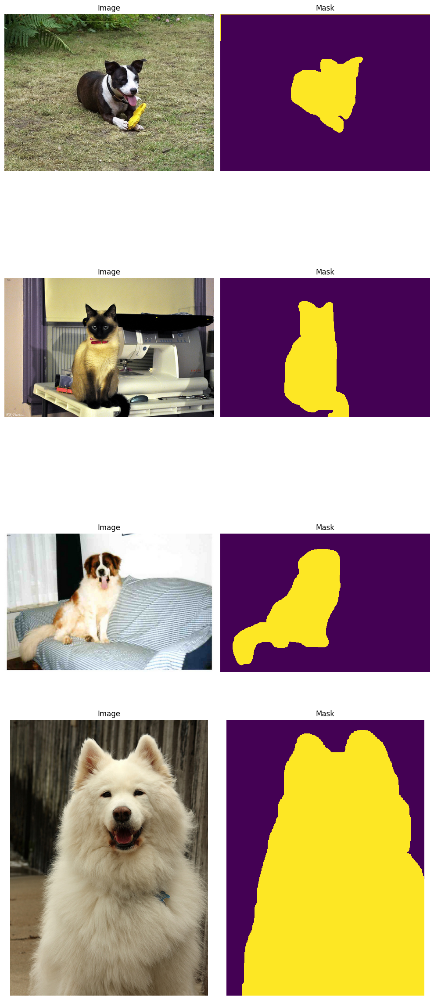

In [9]:
display_few_examples_from_data(train_dataset)
print("Validation dataset")
display_few_examples_from_data(val_dataset)

### Выбираем аугментации для обучения

In [10]:
train_transform = A.Compose(
    [
        A.Resize(512, 512),
     ### Заполнил своими
        A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.5),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
train_dataset = PetDataset(
    "train",
    transform=train_transform,
)

val_transform = A.Compose(
    [
        A.Resize(512, 512),
     ### Заполнил своими
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), ToTensorV2()]
)
val_dataset = PetDataset("Val", transform=train_transform)

Код в ячейке ниже не выводит аугментированные изображения - убираем.

In [ ]:
#display_few_examples_from_data(train_dataset)
#print("Validation dataset")
#display_few_examples_from_data(val_dataset)

Идем читать [документацию](https://albumentations.ai/docs/examples/pytorch_semantic_segmentation/) Augmentations и копипастим необходимую функцию для визуализации аугментированных изображений:

In [12]:
def visualize_augmentations(dataset, idx=0, samples=5):
    '''
    Функция принимает на вход датасет, индекс и количество семплов (по умолчанию 5),
    и выводит аугментированные изображения и их маски
    '''
    # выполняем копию датасета
    dataset = copy.deepcopy(dataset)
    # производим заданные трансформации изображений
    dataset.transform = A.Compose([t for t in dataset.transform if not isinstance(t, (A.Normalize, ToTensorV2))])
    # визуализируем аугментации и маски
    figure, ax = plt.subplots(nrows=samples, ncols=2, figsize=(10, 24))
    for i in range(samples):
        image, mask = dataset[idx]
        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest")
        ax[i, 0].set_title("Augmented image")
        ax[i, 1].set_title("Augmented mask")
        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
    plt.tight_layout()
    plt.show()

Выводим аугментированные изображения тренировочного датасета:

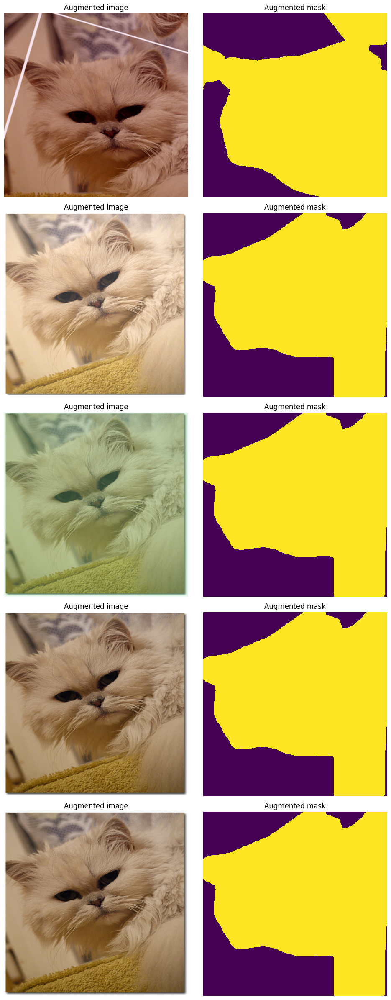

In [13]:
random.seed(42) # вероятно необходимо, т.к. аугментации носят вероятностный характер
visualize_augmentations(train_dataset, idx=55)

### После выбора аугментаций создаем датасеты для обучения.

Я не понял, зачем эта ячейка ниже - датасеты уже созданы. Убираем:

In [ ]:
#train_transform = A.Compose(
#    [
#        A.Resize(512, 512),
#     # Заполни своими
#        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
#        ToTensorV2(),
#    ]
#)
#train_dataset = PetDataset(
#    "train",
#    transform=train_transform,
#)
#
#val_transform = A.Compose(
#    [
#        A.Resize(512, 512),
#     # Заполни своими
#        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
#        ToTensorV2()
#    ]
#)
#val_dataset = PetDataset("Val", transform=train_transform)

## Модель и обучение

In [14]:
def IoU(preds, targs, eps: float = 1e-8):
    """Computes the Jaccard loss, a.k.a the IoU loss.
    Notes: [Batch size,Num classes,Height,Width]
    Args:
        targs: a tensor of shape [B, H, W] or [B, 1, H, W].
        preds: a tensor of shape [B, C, H, W]. Corresponds to
            the raw output or logits of the model. (prediction)
        eps: added to the denominator for numerical stability.
    Returns:
        iou: the average class intersection over union value
             for multi-class image segmentation
    """
    num_classes = preds.shape[1]

    # Single class segmentation?
    if num_classes == 1:
        true_1_hot = (torch.eye(num_classes + 1).to(device)[targs.squeeze(1).to(torch.int64)]) ### добавлен .to(device) и .to(torch.int64)
        true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
        true_1_hot_f = true_1_hot[:, 0:1, :, :]
        true_1_hot_s = true_1_hot[:, 1:2, :, :]
        true_1_hot = torch.cat([true_1_hot_s, true_1_hot_f], dim=1)
        pos_prob = torch.sigmoid(preds)
        neg_prob = 1 - pos_prob
        probas = torch.cat([pos_prob, neg_prob], dim=1)

    # Multi-class segmentation
    else:
        # Convert target to one-hot encoding
        # true_1_hot = torch.eye(num_classes)[torch.squeeze(targs,1)]
        true_1_hot = (torch.eye(num_classes).to(device)[targs.squeeze(1).to(torch.int64)]) ### добавлен .to(device) и .to(torch.int64)

        # Permute [B,H,W,C] to [B,C,H,W]
        true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()

        # Take softmax along class dimension; all class probs add to 1 (per pixel)
        probas = F.softmax(preds, dim=1)

    true_1_hot = true_1_hot.type(preds.type())

    # Sum probabilities by class and across batch images
    dims = (0,) + tuple(range(2, targs.ndimension()))
    intersection = torch.sum(probas * true_1_hot, dims)  # [class0,class1,class2,...]
    cardinality = torch.sum(probas + true_1_hot, dims)  # [class0,class1,class2,...]
    union = cardinality - intersection
    iou = (intersection / (union + eps)).mean()  # find mean of class IoU values
    return iou

Добавим функцию для загрузки предобученной модели:

In [19]:
def get_model():
    """
    Функция загружает предобученную модель FCN_ResNet50 и правит ее архитектуру под
    необходимое количество классов.
    """
    model = fcn_resnet50(weights=FCN_ResNet50_Weights.DEFAULT, progress=False)
    model.classifier[4] = nn.Conv2d(512,1,kernel_size=(1,1),stride=(1,1))
    model.aux_classifier[4] = nn.Conv2d(256,1, kernel_size=(1,1),stride=(1,1))

    return model

In [20]:
class SegModel(pl.LightningModule):
    ### добавлены дополнителные аргументы (или как правильно их назвать?) batch_size, learning_rate, num_workers
    def __init__(self, train_dataset, val_dataset, batch_size, learning_rate, num_workers):
        super(SegModel, self).__init__()
        self.batch_size = batch_size
        self.learning_rate = learning_rate

        self.net = get_model()

        self.trainset = train_dataset
        self.valset = val_dataset
        self.criterion = nn.BCEWithLogitsLoss()

    def forward(self, x):
        return self.net(x)

    def training_step(self, batch, batch_nb):
        img, mask = batch
        out = self.forward(img)['out'] # [B, 1, H, W] ### добавлен ['out']
        loss_val = self.criterion(out.squeeze(1), mask.float()) # [B, 1, H, W] -> # [B, H, W] ### добавлен .float()
        iou_score = IoU(out.float(), mask.long())
        self.log("train_loss", loss_val)
        self.log("train_iou", iou_score, prog_bar=True)
        return loss_val

    def configure_optimizers(self):
        opt = torch.optim.Adam(self.net.parameters(), lr=self.learning_rate)
        sch = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=10)

        return [opt], [sch]

    def train_dataloader(self):
        return DataLoader(self.trainset,
                          batch_size=self.batch_size,
                          num_workers=num_workers, ### добавил num_workers
                          shuffle=True, prefetch_factor=2)

    def val_dataloader(self):
        return DataLoader(self.valset,
                          batch_size=self.batch_size,
                          num_workers=num_workers, shuffle=False) ### добавил num_workers, изменил batch_size и shuffle

    def validation_step(self, batch, batch_idx):
        img, mask = batch
        out = self.forward(img)['out'] ### добавлен ['out']
        loss_val = self.criterion(out.squeeze(1), mask.float()) ### добавлен .float()
        iou_score = IoU(out.float(), mask.long())
        self.log("val_loss", loss_val, prog_bar=True)
        self.log("val_iou", iou_score, prog_bar=True, on_epoch=True)

### Обучение
Начнем с 1-й эпохи и посмотрим, что получится

In [21]:
# зададим некоторые параметры

batch_size = 8
num_workers = 2

learning_rate = 1e-4
max_epochs = 1

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [22]:
model = SegModel(train_dataset, val_dataset, batch_size=batch_size, learning_rate=learning_rate, num_workers=num_workers)

trainer = pl.Trainer(
    ### gpus=1,
    ### tpu_cores=1,
    max_epochs=max_epochs, ### изменено
    callbacks=[
        ModelCheckpoint(save_weights_only=True, mode="max", monitor="val_iou"),
        LearningRateMonitor("epoch"),
        EarlyStopping(monitor="val_iou", mode="max", patience=15),
    ],  # Log learning rate every epoch
    ### progress_bar_refresh_rate=1,
)

trainer.fit(model)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type              | Params
------------------------------------------------
0 | net       | FCN               | 35.3 M
1 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
35.3 M    Trainable params
0         Non-trainable params
35.3 M    Total params
141.227   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1` reached.


### Валидация.
Результат ожидается тут.

In [23]:
trainer.validate(model,
                 ### ckpt_path="lightning_logs/version_/checkpoints/*.ckpt",
                 dataloaders=model.val_dataloader()) ### изменено val_dataloaders на dataloaders

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_iou          │    0.8176044225692749     │
│         val_loss          │    0.14119265973567963    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.14119265973567963, 'val_iou': 0.8176044225692749}]

**Промежуточные выводы:**
- мы достигли val_iou = 0.8176 на валидационной выборке
- без использования аугментации результаты после первой эпохи были бы чуть лучше (>0.82)

## Добавлено

### Визуализация результатов работы обученной модели:

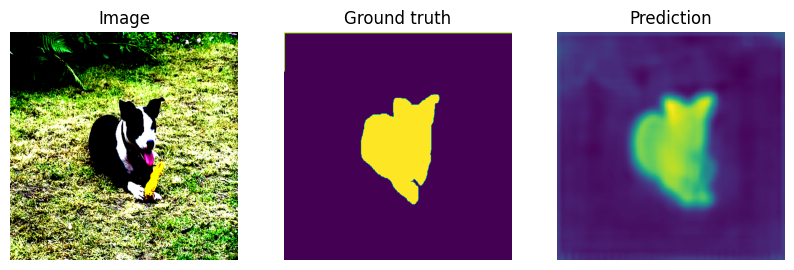

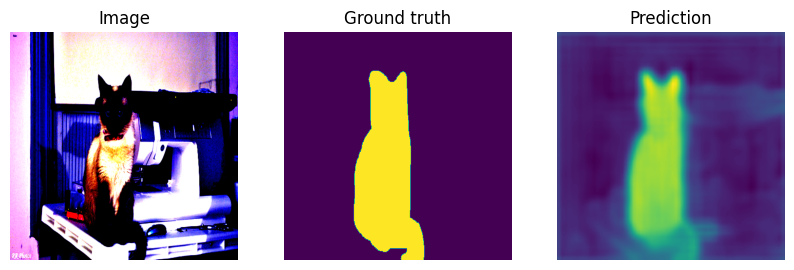

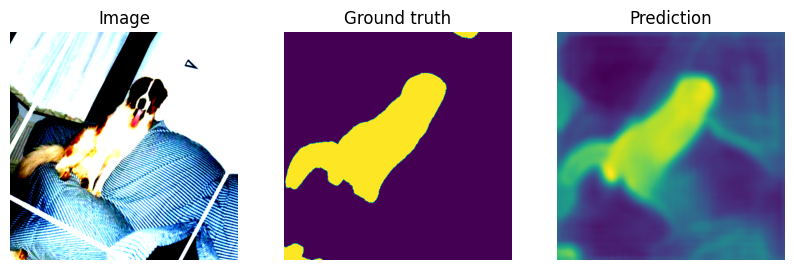

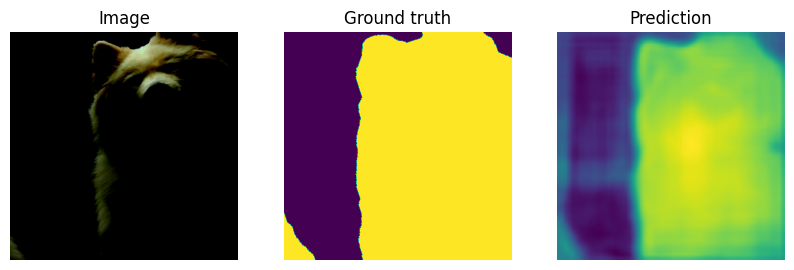

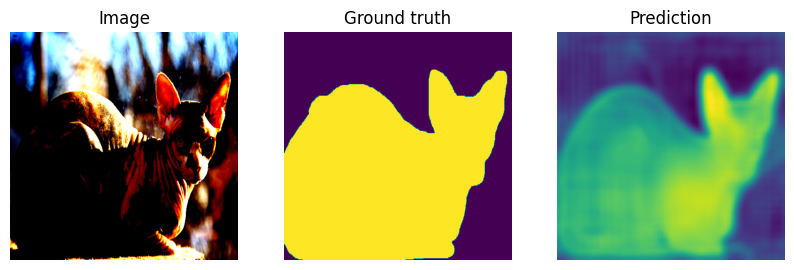

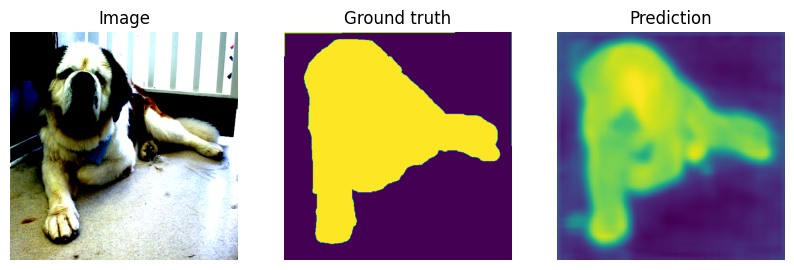

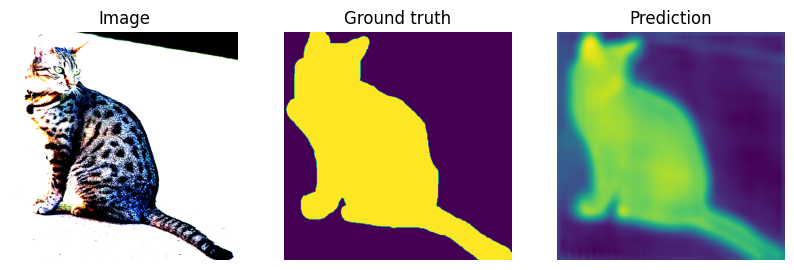

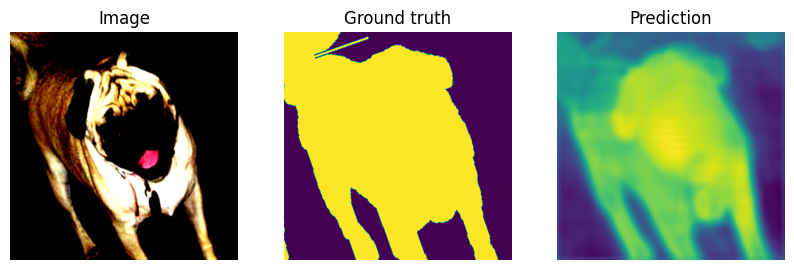

In [24]:
batch = next(iter(model.val_dataloader()))
with torch.no_grad():
    model.eval()
    logits = model(batch[0])
pr_masks = logits['out']
for image, gt_mask, pr_mask in zip(batch[0], batch[1], pr_masks):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image.numpy().transpose(1, 2, 0))  # convert CHW -> HWC
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask.numpy().squeeze()) # just squeeze classes dim, because we have only one class
    plt.title("Ground truth")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pr_mask.numpy().squeeze()) # just squeeze classes dim, because we have only one class
    plt.title("Prediction")
    plt.axis("off")

    plt.show()

Мы видим, что действительно модель угадывает маски, однако если границы реальных масок четкие, то границы предсказанных масок размыты. Интересно, почему?

### Дообучение модели

Можем ли мы улучшить качество модели, увеличив время обучения? Давайте проверим это, продолжив обучение еще на 5 эпохах:

In [26]:
max_epochs = 5

trainer = pl.Trainer(
    max_epochs=max_epochs,
    callbacks=[
        ModelCheckpoint(save_weights_only=True, mode="max", monitor="val_iou"),
        LearningRateMonitor("epoch"),
        EarlyStopping(monitor="val_iou", mode="max", patience=15),
    ],
)
trainer.fit(model)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type              | Params
------------------------------------------------
0 | net       | FCN               | 35.3 M
1 | criterion | BCEWithLogitsLoss | 0     
------------------------------------------------
35.3 M    Trainable params
0         Non-trainable params
35.3 M    Total params
141.227   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.


### Валидация дообученной модели

In [27]:
trainer.validate(model, dataloaders=model.val_dataloader())

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_iou          │    0.8509820699691772     │
│         val_loss          │    0.12123949080705643    │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.12123949080705643, 'val_iou': 0.8509820699691772}]

Да, мы достигли **val_iou = 0.85**!!!

### Визуализация результатов работы дообученной модели:

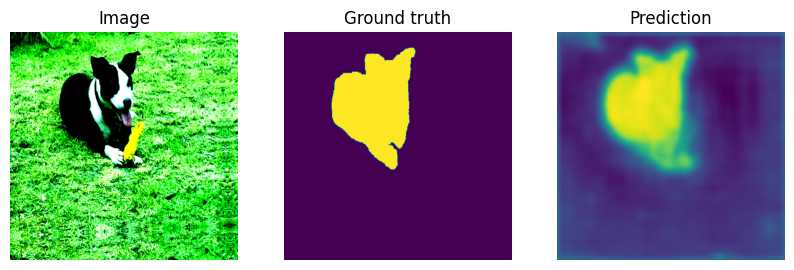

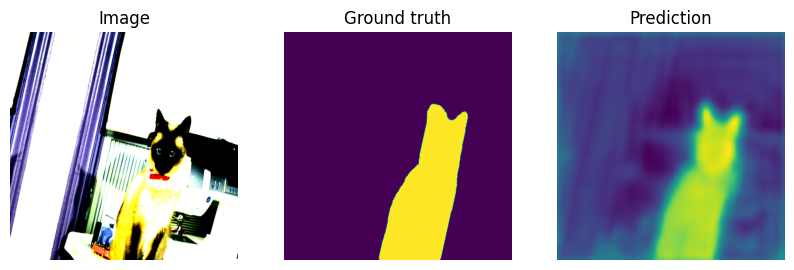

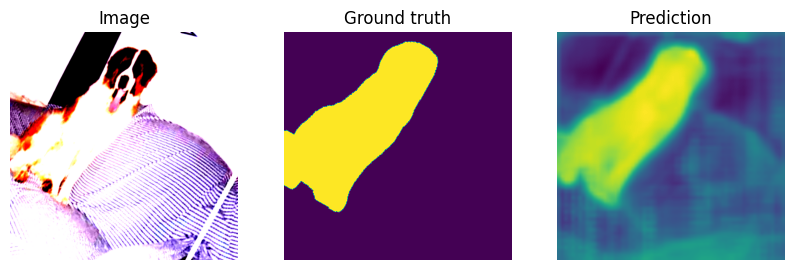

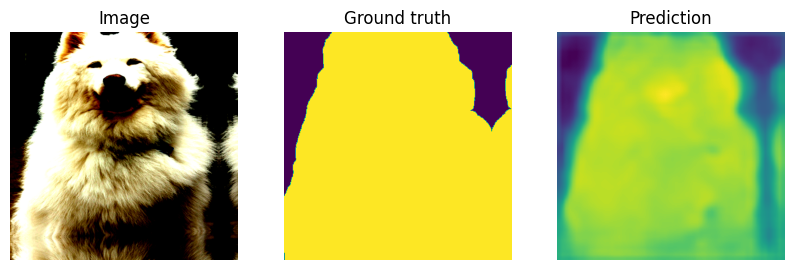

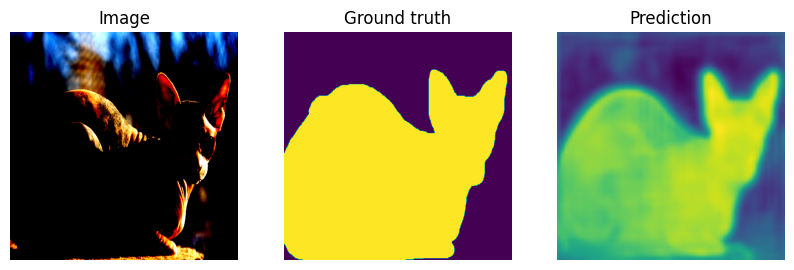

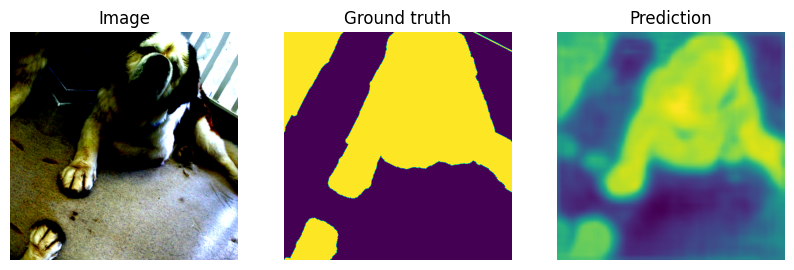

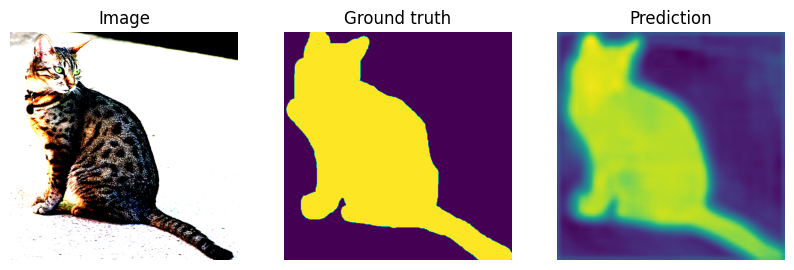

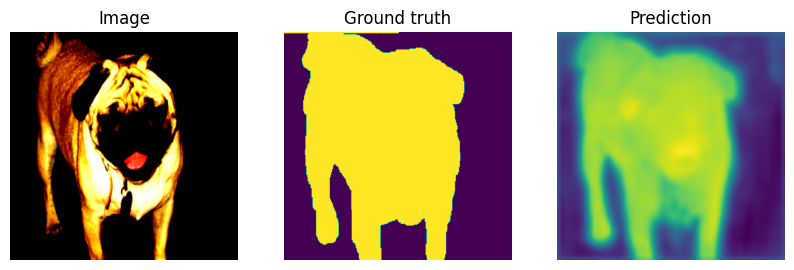

In [28]:
batch = next(iter(model.val_dataloader()))
with torch.no_grad():
    model.eval()
    logits = model(batch[0])
pr_masks = logits['out']
for image, gt_mask, pr_mask in zip(batch[0], batch[1], pr_masks):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image.numpy().transpose(1, 2, 0))  # convert CHW -> HWC
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask.numpy().squeeze()) # just squeeze classes dim, because we have only one class
    plt.title("Ground truth")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pr_mask.numpy().squeeze()) # just squeeze classes dim, because we have only one class
    plt.title("Prediction")
    plt.axis("off")

    plt.show()

В принципе, все то же самое. Но почему предсказанные маски размыты? Давайте все-же изучим этот вопрос:

In [30]:
batch[1].unique()

tensor([0., 1.])

In [32]:
pr_masks.unique()

tensor([-10.6726, -10.6702, -10.6697,  ...,  10.5932,  10.5959,  10.5988])

Ага, мы видим, что реальная маска содержит 0 и 1, где пиксель = 0 это фон, а где он = 1 - это маска животного. Тут все понятно. Однако в предсказанных масках, мы видим, что значения пикселей варьируют от (грубо говоря) -10.67 до 10.6. Не совсем понимаю, что это - вероятности, выраженные в значениях пикселей, которые ведут к размытию при визуализации? Помнится, было задание, где мы устанавливали порог, для визуализации маски. Попробуем здесь сделать также, взяв за уровень 0.

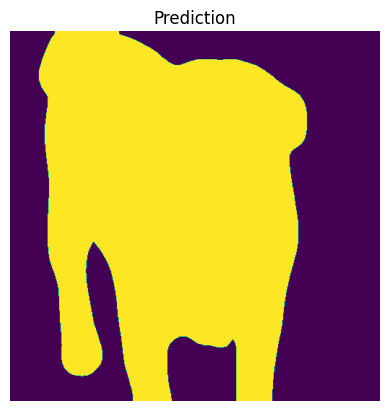

In [41]:
plt.imshow(pr_mask.numpy().squeeze()>0)
plt.title("Prediction")
plt.axis("off")

plt.show()

Получилось. Повторим визуализацию работы модели, учитывая наши изыскания:

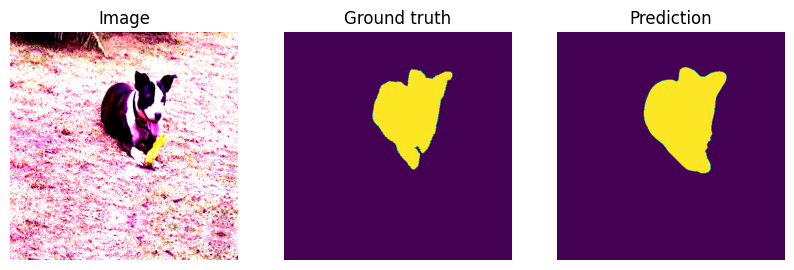

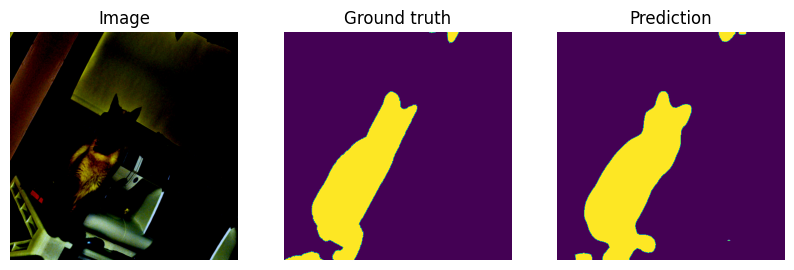

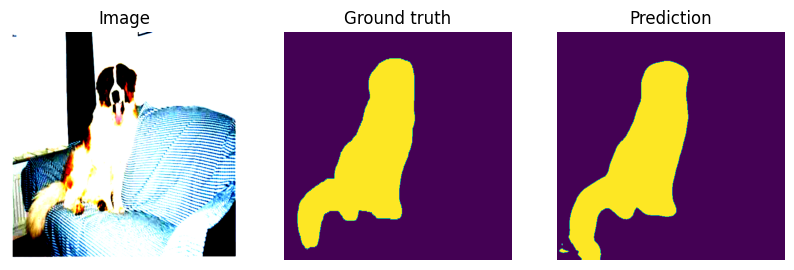

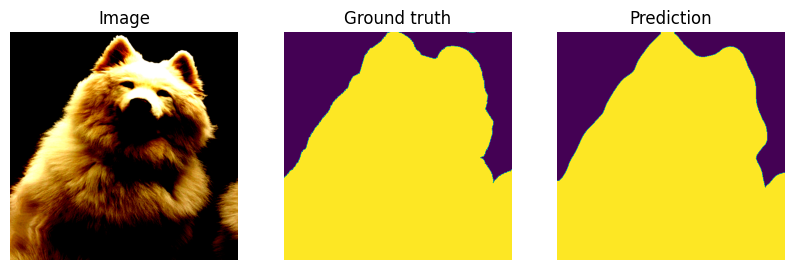

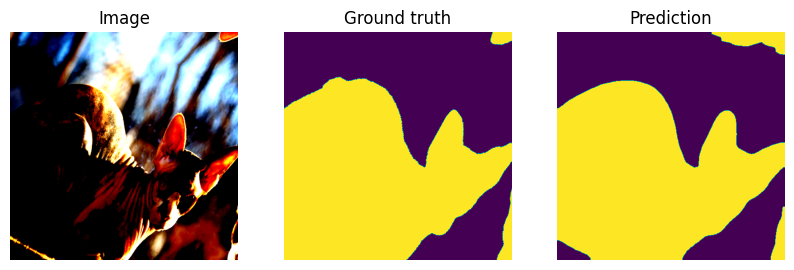

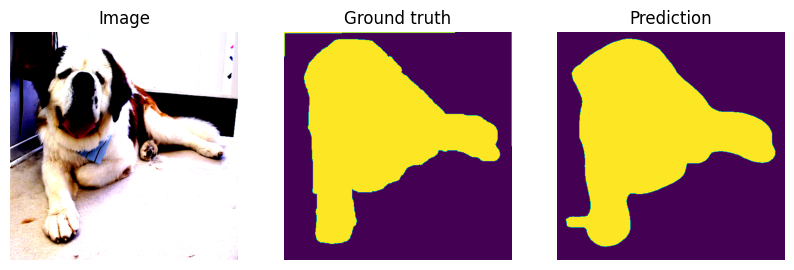

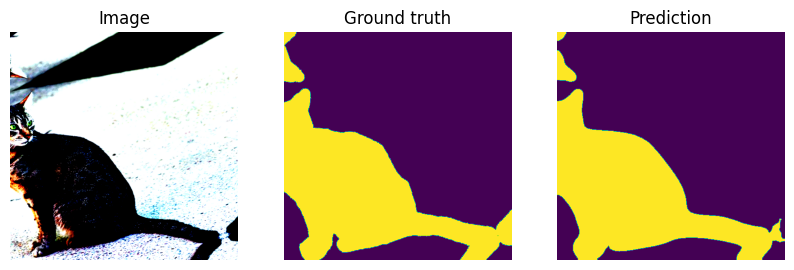

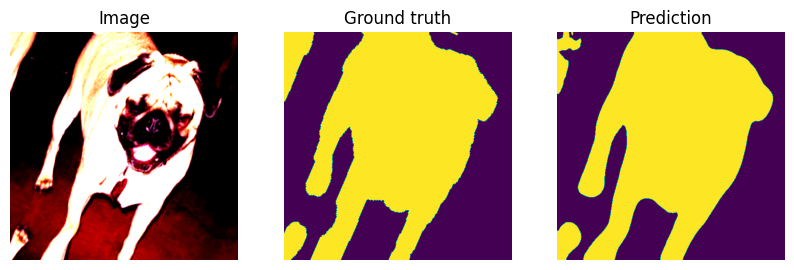

In [42]:
batch = next(iter(model.val_dataloader()))
with torch.no_grad():
    model.eval()
    logits = model(batch[0])
pr_masks = logits['out']
for image, gt_mask, pr_mask in zip(batch[0], batch[1], pr_masks):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image.numpy().transpose(1, 2, 0))  # convert CHW -> HWC
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask.numpy().squeeze()) # just squeeze classes dim, because we have only one class
    plt.title("Ground truth")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pr_mask.numpy().squeeze()>0) # just squeeze classes dim, because we have only one class
    plt.title("Prediction")
    plt.axis("off")

    plt.show()

In [43]:
# сохраним зависимости
!pip freeze > requirements.txt

# **Выводы:**
- был взят за основу представленный учебный ноутбук, выполнена правка и дополнение кода
- достигнут заданный уровень val_iou >= 0.7 (мы достигли его значения = **0.85**)
- визуализированы результаты работы модели
- остался не до конца раскрытым вопрос (для меня лично), что именно выдает модель, предсказывая маску на изображении (вероятность принадлежности пикселя к фону или животному?)